In [1]:
import os
import moten
import numpy as np
import cv2
from IPython.display import Video, Image, display
import matplotlib.pyplot as plt
import imageio
import io

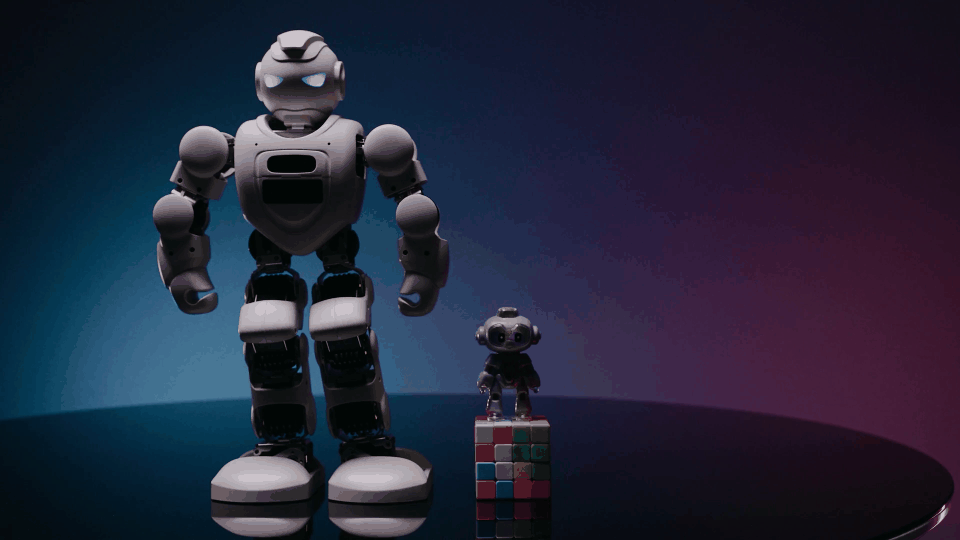

In [4]:
video_idx = 1000
video_file = os.path.join(os.path.expanduser('~'), "Documents/knapen_videos", f"{video_idx:04d}_fw.mp4")

def show_video_as_gif(path, max_frames=100, fps=10, scale=0.5):
    cap = cv2.VideoCapture(path)
    frames = []
    count = 0

    while cap.isOpened() and count < max_frames:
        ret, frame = cap.read()
        if not ret:
            break

        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        if scale != 1.0:
            h, w = frame.shape[:2]
            frame = cv2.resize(frame, (int(w*scale), int(h*scale)))

        frames.append(frame)
        count += 1

    cap.release()

    buf = io.BytesIO()
    imageio.mimsave(buf, frames, format="GIF", fps=fps)
    buf.seek(0)

    display(Image(data=buf.getvalue(), format="gif"))

show_video_as_gif(video_file)

In [5]:
luminance_images = moten.io.video2luminance(video_file, nimages=100)

In [6]:
nimages, vdim, hdim = luminance_images.shape
print(nimages, vdim, hdim)

60 1080 1920


In [ ]:
pyramid = moten.get_default_pyramid(vhsize=(vdim, hdim), fps=24)
features = pyramid.project_stimulus(luminance_images)

In [ ]:
print(features.shape)
fig, ax = plt.subplots(figsize=(12, 12))
ax.matshow(features, aspect='auto')
plt.show()